In [1]:
import sys
sys.path.append("../")

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.pair_trade_percent_binance import PairTradePercent
from technicals.indicators import Donchian_Close

from functools import reduce

In [3]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

def filtro_melhores_parametros(df, column='strat'):
    """
    Filtra e exibe as melhores combinações de parâmetros com desempenho positivo.
    """
    
    # Lista de colunas que são parâmetros e de 'strat'
    # Excluímos colunas que não são parâmetros relevantes para o agrupamento
    param_cols = [col for col in df.columns if col not in ['pair', 'granularity', 'ema_s', 'ema_l', 'strat', 'res', 'sig', 'c',
           'wp', 'rsi_f', 'rsi_w', 'adx_f', 'adx_w', 'max_o',
           's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
           'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos',
           'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p',
           'first_t', 'last_t', 'r', 'df']]
    
    # Encontrar a combinação de parâmetros com o melhor desempenho médio
    best_params_mean = df.groupby(param_cols)[column].mean().sort_values(ascending=False).reset_index()
    return best_params_mean
    
def analise_distribuicao(df):
    """
    Exibe gráficos de boxplot para mostrar a variação de retorno (strat) em relação aos principais parâmetros.
    """
    param_cols = ['ep', 'ep2', 'force', 'sl_per']
    
    for param in param_cols:
        plt.figure(figsize=(8, 6))
        df.boxplot(column='strat', by=param, grid=False)
        plt.title(f'Distribuição de Retorno (strat) por Valores de {param}')
        plt.suptitle('')
        plt.xlabel(param)
        plt.ylabel('Retorno (strat)')
        plt.show()

def analise_sensibilidade_parametros(df):
    """
    Aplica um modelo Random Forest para calcular a importância dos parâmetros e exibe os resultados.
    """
    X = df[['ep', 'ep2', 'st', 'force', 'sl_per']]
    y = df['strat']

    # Divisão dos dados em treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Treinando o modelo Random Forest
    model = RandomForestRegressor(random_state=42, n_estimators=100)
    model.fit(X_train, y_train)

    # Avaliando o modelo no conjunto de teste
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Extraindo a importância dos parâmetros
    importance_df = pd.DataFrame({
        'Parâmetro': X.columns,
        'Importância': model.feature_importances_
    }).sort_values(by='Importância', ascending=False).reset_index(drop=True)

    print("MSE:", mse)
    print("R²:", r2)
    return importance_df




In [5]:

# def calculate_rsi(df, period=14):
#     # Calcula as diferenças dos preços de fechamento
#     df['Price Change'] = df['Close'].diff()
    
#     # Separa ganhos e perdas
#     df['Gain'] = df['Price Change'].apply(lambda x: x if x > 0 else 0)
#     df['Loss'] = df['Price Change'].apply(lambda x: -x if x < 0 else 0)
    
#     # Calcula as médias móveis exponenciais dos ganhos e perdas
#     avg_gain = df['Gain'].rolling(window=period).mean()
#     avg_loss = df['Loss'].rolling(window=period).mean()
    
#     # Calcula o RSI
#     rs = avg_gain / avg_loss
#     df['RSI'] = 100 - (100 / (1 + rs))
    
#     # Limpa colunas temporárias
#     df.drop(columns=['Price Change', 'Gain', 'Loss'], inplace=True)
    
#     return df




# def calculate_adx(df, period=14):
#     # Cálculo de +DM, -DM e TR
#     df['High-Low'] = df['High'] - df['Low']
#     df['High-Close'] = abs(df['High'] - df['Close'].shift(1))
#     df['Low-Close'] = abs(df['Low'] - df['Close'].shift(1))
    
#     df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)
#     df['+DM'] = np.where((df['High'] - df['High'].shift(1)) > (df['Low'].shift(1) - df['Low']), 
#                          np.maximum(df['High'] - df['High'].shift(1), 0), 0)
#     df['-DM'] = np.where((df['Low'].shift(1) - df['Low']) > (df['High'] - df['High'].shift(1)), 
#                          np.maximum(df['Low'].shift(1) - df['Low'], 0), 0)
    
#     # Suavizando os valores de TR, +DM e -DM com média móvel exponencial
#     df['TR_smooth'] = df['TR'].rolling(window=period).sum()
#     df['+DM_smooth'] = df['+DM'].rolling(window=period).sum()
#     df['-DM_smooth'] = df['-DM'].rolling(window=period).sum()
    
#     # Cálculo de +DI e -DI
#     df['+DI'] = 100 * (df['+DM_smooth'] / df['TR_smooth'])
#     df['-DI'] = 100 * (df['-DM_smooth'] / df['TR_smooth'])
    
#     # Cálculo do DX
#     df['DX'] = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    
#     # Cálculo do ADX
#     df['ADX'] = df['DX'].rolling(window=period).mean()

#     # Limpando colunas temporárias
#     df.drop(columns=['High-Low', 'High-Close', 'Low-Close', 'TR', '+DM', '-DM', 'TR_smooth', '+DM_smooth', '-DM_smooth', 'DX'], inplace=True)

#     return df
    
# # Função para calcular a variação percentual acumulada
# def calculate_percent_change(close_prices, window):
#     percent_change = np.zeros(len(close_prices))

#     for i in range(window, len(close_prices)):
#         window_sum = 0.0
#         for j in range(i - window + 1, i + 1):
#             percent_change[j] = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
#             window_sum += percent_change[j]
#         percent_change[i] = window_sum

#     return percent_change


# Função para calcular a variação percentual acumulada com uma janela deslizante correta
def calculate_percent_change(close_prices, window):
    percent_change = np.zeros(len(close_prices))

    for i in range(window, len(close_prices)):
        window_sum = 0.0
        for j in range(i - window + 1, i + 1):
            # Calcula a variação percentual entre o ponto atual e o ponto anterior
            change = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
            window_sum += change
        # Atribui o valor acumulado da janela atual ao ponto final da janela
        percent_change[i] = window_sum

    return percent_change



# Função para calcular a EMA
def calculate_ema(values, period):
    ema = np.zeros(len(values))
    multiplier = 2 / (period + 1)
    ema[period - 1] = values[period - 1]  # O primeiro valor da EMA é igual ao valor inicial
    for i in range(period, len(values)):
        ema[i] = (values[i] - ema[i - 1]) * multiplier + ema[i - 1]
    return ema

# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_indicators(df, window=14, ema_period_1=10, ema_period_2=60):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    ema_1 = calculate_ema(percent_change, ema_period_1)
    ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # Adiciona os resultados ao DataFrame original
    df['Percent_Change'] = percent_change
    df['EMA_percent_s'] = ema_1
    df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return df


# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_emaper(df, window=14):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    # ema_1 = calculate_ema(percent_change, ema_period_1)
    # ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # # Adiciona os resultados ao DataFrame original
    # df['Percent_Change'] = percent_change
    # df['EMA_percent_s'] = ema_1
    # df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return percent_change
    


import pandas as pd
import numpy as np

def calculate_rsi(df, period=14):
    # Calcula as diferenças dos preços de fechamento
    delta = df['Close'].diff()
    
    # Separa ganhos e perdas
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    
    # Usa a média móvel exponencial para suavizar os ganhos e perdas
    avg_gain = pd.Series(gain).ewm(alpha=1/period, min_periods=period).mean()
    avg_loss = pd.Series(loss).ewm(alpha=1/period, min_periods=period).mean()
    
    # Calcula o RSI
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    
    # Adiciona o RSI ao DataFrame e retorna
    df['RSI'] = rsi
    return df

def calculate_adx(df, period=14):
    # Calcula +DM, -DM e TR
    high_diff = df['High'].diff()
    low_diff = df['Low'].diff()
    df['+DM'] = np.where((high_diff > low_diff) & (high_diff > 0), high_diff, 0)
    df['-DM'] = np.where((low_diff > high_diff) & (low_diff > 0), low_diff, 0)
    df['TR'] = np.maximum(df['High'] - df['Low'], 
                          np.maximum(abs(df['High'] - df['Close'].shift(1)), 
                                     abs(df['Low'] - df['Close'].shift(1))))

    # Suaviza TR, +DM e -DM com a média móvel exponencial
    atr = df['TR'].ewm(alpha=1/period, min_periods=period).mean()
    df['+DI'] = 100 * (df['+DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    df['-DI'] = 100 * (df['-DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    
    # Calcula o DX e o ADX
    dx = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    df['ADX'] = dx.ewm(alpha=1/period, min_periods=period).mean()

    # Remove colunas temporárias
    df.drop(columns=['+DM', '-DM', 'TR'], inplace=True)
    
    return df


In [6]:
def run_pair(pair,
             granularity,
             ema_s=10,
             ema_l=200,
             lenght=10000,
             window_percent=100,
            ema_percent1=100,
            ema_percent2=100,
             strategy=1,
             EMA_percent_s_force=0.01,
             stop_loss_percent=-0.02,
             rsi_force=70,
             rsi_window=50,
             adx_force=20,
             adx_window=50
            ):
    df = pd.read_pickle(f"crypto/{pair}_{granularity}.pkl")
    df['time'] = df['Time'].copy()
    df['strategy'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['creturns'] = df['returns'].cumsum()
    df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['cLog_Returns'] = df['Log_Returns'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]

    df['EMA_short'] = df.Close.ewm(span=ema_s, min_periods=ema_s).mean()
    df['EMA_long'] = df.Close.ewm(span=ema_l, min_periods=ema_l).mean()

    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # df = calculate_indicators(df, window_percent, ema_percent1, ema_percent2)

    # df['Percent_Change'] = calculate_emaper(df, window_percent)
    # df['EMA_percent_s'] = calculate_ema(df['Percent_Change'].values, ema_percent1)
    # df['double_EMA_percent_s'] =  calculate_ema(df['EMA_percent_s'].values,ema_percent2)

    df['Percent_Change_1'] = calculate_emaper(df, 1)
    df['EMA_percent_s_1'] = calculate_ema(df['Percent_Change_1'].values, 10)
    
    df['Percent_Change_10'] = calculate_emaper(df, 10)
    df['EMA_percent_s_10'] = calculate_ema(df['Percent_Change_10'].values, 10)

    df['Percent_Change_50'] = calculate_emaper(df, 50)
    df['EMA_percent_s_50'] = calculate_ema(df['Percent_Change_50'].values, 10)
    
    df['Percent_Change_150'] = calculate_emaper(df, 150)
    df['EMA_percent_s_150'] = calculate_ema(df['Percent_Change_150'].values, 10)

    df['Percent_Change_200'] = calculate_emaper(df, 200)
    df['EMA_percent_s_200'] = calculate_ema(df['Percent_Change_200'].values, 10)

    # df['Percent_Change_500'] = calculate_emaper(df, 500)
    # df['EMA_percent_s_500'] = calculate_ema(df['Percent_Change_500'].values, 10)

    # df['Percent_Change_1000'] = calculate_emaper(df, 1000)
    # df['EMA_percent_s_1000'] = calculate_ema(df['Percent_Change_1000'].values, 10)

    # df['Percent_Change_2000'] = calculate_emaper(df, 2000)
    # df['EMA_percent_s_2000'] = calculate_ema(df['Percent_Change_2000'].values, 10)
    
    
    df['Average_EMA_percent'] = df[['EMA_percent_s_50', 'EMA_percent_s_150', 'EMA_percent_s_200']].mean(axis=1)
    df['Average_EMA_percent_ema_short'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent1)
    df['Average_EMA_percent_ema_long'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent2)
    df['Average_EMA_percent_ema_1'] = calculate_ema(df['Average_EMA_percent'].values, 1)
    df['Average_EMA_percent_ema_5'] = calculate_ema(df['Average_EMA_percent'].values, 5)
    df['Average_EMA_percent_ema_50'] = calculate_ema(df['Average_EMA_percent'].values, 50)
    df['Average_EMA_percent_ema_100'] = calculate_ema(df['Average_EMA_percent'].values, 100)

    df = Donchian_Close(df, window_percent)
    
    df = calculate_adx(df, adx_window)
    df = calculate_rsi(df, rsi_window)
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = PairTradePercent(
        df,
        strategy,
        EMA_percent_s_force,
        stop_loss_percent,
        rsi_force,
        adx_force
    )
    
    gt.run_test()
    return gt
    

In [7]:
# df = run_pair(pair='BTCUSDT', 
#               granularity='1m', 
#               ema=10,
#               lenght=10000, 
#               pairs_trade_benchmark = ["BTCUSDT",'ETHUSDT','BNBUSDT','LTCUSDT'],
#             window_percent=100,
#             ema_percent1=100,
#             ema_percent2=100,)


In [8]:
# df.columns

In [9]:
pairs = ["ADAUSDT","BTCUSDT",'ETHUSDT','BNBUSDT','XRPUSDT','LTCUSDT']
# pairs = ['ADAUSDT']

In [10]:
def get_list_args():
    args_dic_list = []
    for ema_s in [10]:
        for ema_l in [5000]:
            for pair in pairs:
                for granularity in ['1m']:
                    for lenght in ['2024-01-01 00:00:00']:
                        for window_percent in [500]:
                            for ema_percent1 in [5,10,20,50]:
                                for ema_percent2 in [20,50,100]:
                                    if ema_percent1 < ema_percent2:
                                        for EMA_percent_s_force in [1,2,3,4,5]:
                                            for stop_loss_percent in [-0.01,-0.02,-0.03,-0.04]:
                                                for strategy in [14]:#,11,12]:
                                                    rsi_forces = [50]
                                                    rsi_windows = [50]
                                                    adx_forces = [20]
                                                    adx_windows = [50]
                                                    if strategy in [1,2,3]:
                                                        rsi_forces, rsi_windows, adx_forces, adx_windows = [10], [10], [10], [10]
                                                    elif strategy in [4,6,8]:
                                                        adx_forces, adx_windows = [10], [10]
                                                    elif strategy in [5,7,9]:
                                                        rsi_forces, rsi_windows = [10], [10]
                                                    for rsi_force in rsi_forces:
                                                        for rsi_window in rsi_windows:
                                                            for adx_force in adx_forces:
                                                                for adx_window in adx_windows:
                                                                
                                                                    args_dic = {"pair": pair,
                                                                                "granularity":granularity,
                                                                                'ema_s': ema_s,
                                                                                'ema_l': ema_l,
                                                                                'lenght': lenght,
                                                                                'window_percent': window_percent,
                                                                               'ema_percent1': ema_percent1,
                                                                               'ema_percent2': ema_percent2,
                                                                                'strategy':strategy,
                                                                               'EMA_percent_s_force':EMA_percent_s_force,
                                                                                'stop_loss_percent':stop_loss_percent,
                                                                               'rsi_force': rsi_force,
                                                                               'rsi_window':rsi_window,
                                                                               'adx_force': adx_force,
                                                                               'adx_window':adx_window}
                                                                    args_dic_list.append(args_dic)

    return args_dic_list

In [11]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            pair=arg['pair'],
            granularity=arg['granularity'],
            ema_s=arg['ema_s'],
            ema_l=arg['ema_l'],
            lenght = arg['lenght'],
            window_percent = arg['window_percent'],
            ema_percent1 = arg['ema_percent1'],
            ema_percent2 = arg['ema_percent2'],
            stop_loss_percent = arg['stop_loss_percent'],
            strategy = arg['strategy'],
            rsi_force = arg['rsi_force'],
            rsi_window = arg['rsi_window'],
            adx_force = arg['adx_force'],
            adx_window = arg['adx_window'],
            res=run_pair(
                pair=arg['pair'],
                granularity=arg['granularity'],
                ema_s=arg['ema_s'],
                ema_l=arg['ema_l'],
                lenght = arg['lenght'],
                window_percent = arg['window_percent'],
                ema_percent1 = arg['ema_percent1'],
                ema_percent2= arg['ema_percent2'],
                strategy= arg['strategy'],
                EMA_percent_s_force=arg['EMA_percent_s_force'],
                stop_loss_percent=arg['stop_loss_percent'],
                rsi_force = arg['rsi_force'],
                rsi_window = arg['rsi_window'],
                adx_force=  arg['adx_force'],
                adx_window = arg['adx_window'],
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # <-- can be shared between processes.
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L,args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)
        

In [12]:
%%time

run_ema_macd()

1080
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
ALL DONE
CPU times: user 1.51 s, sys: 18.6 s, total: 20.1 s
Wall time: 2h 44min 40s


In [7]:
# with open(f"./result-binance-acumulative-percentual-st-14ssss.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo


with open(f"result-binance-acumulative-percentual-st-14.pkl", "rb") as f:
    res = pickle.load(f)

In [8]:
# ddf.columns

In [9]:
# ddf.describe()

In [10]:
res = lista


NameError: name 'lista' is not defined

In [13]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]
        res_pos = r['res'].df_results[r['res'].df_results['result'] > 0]
        res_neg = r['res'].df_results[r['res'].df_results['result'] <= 0]
        sum_neg = res_neg.result.sum() * -1
        sum_pos = res_pos.result.sum()

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy'] <= 0]
        sum_neg_s = res_neg_s.strategy.sum() *-1
        sum_pos_s = res_pos_s.strategy.sum()
        dic_res.append(
            dict(
                pair = r['pair'],
                granularity = r['granularity'],
                ema_s = r['ema_s'],
                ema_l = r['ema_l'],
                strat = round(r['res'].df_results.strategy.sum(),3),
                res = round(r['res'].df_results.result.sum(),3),
                sig = signal_up,
                c = r['res'].df_results['count'].mean(),
                wp = r['window_percent'],
                ep = r['ema_percent1'],
                ep2 = r['ema_percent2'],
                rsi_f = r['rsi_force'],
                rsi_w = r['rsi_window'],
                adx_f = r['adx_force'],
                adx_w = r['adx_window'],
                
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                force = r['res'].EMA_percent_s_force,
                sl_per = r['res'].stop_loss_percent,
                              
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),
                
                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   
                len_pos = len(res_pos),
                len_neg = len(res_neg),
                sum_pos = sum_pos,
                sum_neg = sum_neg,
                Rel_len_pos_neg = len(res_pos)/(len(res_pos)+ len(res_neg)),
                Rel_pos_neg = sum_pos/(sum_pos+ sum_neg),

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                # df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [14]:
pd.set_option('display.max_columns', None)

df_res = pd.DataFrame(dic_res)



print(df_res.columns)




Index(['pair', 'granularity', 'ema_s', 'ema_l', 'strat', 'res', 'sig', 'c',
       'wp', 'ep', 'ep2', 'rsi_f', 'rsi_w', 'adx_f', 'adx_w', 'max_o', 'st',
       'force', 'sl_per', 's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos',
       'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p',
       'first_t', 'last_t', 'r'],
      dtype='object')


In [15]:
pd.set_option('display.max_rows', None)

In [16]:
df_res_test = df_res.copy()

df_res_test = df_res_test.sort_values(by=['pair','strat'], ascending=False).reset_index(drop=True)
df_res_test[['pair', 'granularity', 'strat', 'res', 'c',
        'wp','ep','ep2', 'max_o', 'st', 'force',
       'sl_per' ,'s_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat', 'l_n_strat',
       'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos', 'sum_neg',
       'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p', 'first_t',
       'last_t', 'r']].head(200)

,pair,granularity,strat,res,c,wp,ep,ep2,max_o,st,force,sl_per,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_p,last_p,first_t,last_t,r
0,XRPUSDT,1m,0.582,0.326,334.252809,500,10,50,4,14,2,-0.04,0.945772,0.363390,0.722425,169,9,0.949438,178,0,132,46,0.5381,0.2121,0.741573,0.717275,0.5868,0.6114,2024-01-07 23:56:00,2024-09-30 11:53:00,running start_index_m5 count trigger_t...
1,XRPUSDT,1m,0.566,0.308,169.606742,500,10,50,3,14,2,-0.03,1.069472,0.503591,0.679866,162,16,0.910112,178,0,129,49,0.6025,0.2949,0.724719,0.671384,0.5868,0.6114,2024-01-07 23:56:00,2024-09-30 11:53:00,running start_index_m5 count trigger_t...
2,XRPUSDT,1m,0.550,0.313,286.764398,500,5,50,4,14,2,-0.04,0.997873,0.447599,0.690344,180,11,0.942408,191,0,148,43,0.5754,0.2627,0.774869,0.686553,0.5868,0.6114,2024-01-07 23:53:00,2024-09-30 12:48:00,running start_index_m5 count trigger_t...
3,XRPUSDT,1m,0.497,0.303,213.225806,500,20,50,3,14,2,-0.04,0.741150,0.244500,0.751940,149,6,0.961290,155,0,129,26,0.4438,0.1405,0.832258,0.759541,0.5868,0.6114,2024-01-08 00:01:00,2024-09-30 13:20:00,running start_index_m5 count trigger_t...
4,XRPUSDT,1m,0.454,0.327,414.657732,500,10,100,5,14,1,-0.04,1.938360,1.484558,0.566289,449,36,0.925773,485,0,378,107,1.1678,0.8404,0.779381,0.581516,0.5868,0.6114,2024-01-05 02:48:00,2024-09-30 16:54:00,running start_index_m5 count trigger_t...
5,XRPUSDT,1m,0.443,0.252,184.837696,500,5,50,3,14,2,-0.03,1.008601,0.565425,0.640778,172,19,0.900524,191,0,142,49,0.5826,0.3307,0.743455,0.637906,0.5868,0.6114,2024-01-07 23:53:00,2024-09-30 11:39:00,running start_index_m5 count trigger_t...
6,XRPUSDT,1m,0.436,0.413,416.933950,500,5,50,7,14,1,-0.04,3.472836,3.036514,0.533515,682,75,0.900925,757,0,583,174,2.0733,1.6599,0.770145,0.555368,0.5868,0.6114,2024-01-05 02:41:00,2024-09-30 22:17:00,running start_index_m5 count trigger_t...
7,XRPUSDT,1m,0.436,0.267,166.019355,500,20,50,3,14,2,-0.03,0.811381,0.375285,0.683748,142,13,0.916129,155,0,124,31,0.4820,0.2146,0.800000,0.691932,0.5868,0.6114,2024-01-08 00:01:00,2024-09-30 13:20:00,running start_index_m5 count trigger_t...
8,XRPUSDT,1m,0.407,0.245,301.849057,500,10,20,5,14,2,-0.04,1.226621,0.819829,0.599390,245,20,0.924528,265,0,204,61,0.7149,0.4699,0.769811,0.603393,0.5868,0.6114,2024-01-05 02:17:00,2024-09-30 13:59:00,running start_index_m5 count trigger_t...
9,XRPUSDT,1m,0.368,0.224,258.940972,500,5,20,5,14,2,-0.04,1.246170,0.878333,0.586570,266,22,0.923611,288,0,214,74,0.7296,0.5058,0.743056,0.590578,0.5868,0.6114,2024-01-05 02:37:00,2024-09-30 13:53:00,running start_index_m5 count trigger_t...


In [17]:
# df_res_test.info()

In [18]:
# Lista de colunas que são parâmetros e de 'strat'
# Excluímos colunas que não são parâmetros relevantes para o agrupamento
param_cols = [col for col in df_res_test.columns if col not in ['pair', 'granularity', 'ema_s', 'ema_l', 'strat', 'res', 'sig', 'c',
       'wp', 'rsi_f', 'rsi_w', 'adx_f', 'adx_w', 'max_o',
       's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos',
       'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p',
       'first_t', 'last_t', 'r', 'df']]


# Encontrar a combinação de parâmetros com o melhor desempenho em algum ativo
best_params_max = df_res_test.groupby(param_cols)['strat'].max().sort_values(ascending=False).reset_index()
print("Melhores parâmetros pelo desempenho máximo:")
print(best_params_max)

Melhores parâmetros pelo desempenho máximo:
     ep  ep2  st  force  sl_per  strat
0     5   50  14      1   -0.04  1.024
1     5  100  14      1   -0.03  0.981
2    20   50  14      1   -0.04  0.938
3     5  100  14      1   -0.04  0.930
4    10   50  14      1   -0.03  0.752
5     5   50  14      1   -0.03  0.734
6    10   50  14      1   -0.04  0.719
7    20   50  14      1   -0.03  0.701
8     5  100  14      1   -0.02  0.602
9     5   50  14      2   -0.04  0.596
10   10   50  14      2   -0.04  0.582
11   10  100  14      1   -0.04  0.574
12   10   50  14      2   -0.03  0.566
13   20   50  14      2   -0.04  0.497
14   50  100  14      2   -0.04  0.488
15   20  100  14      1   -0.04  0.481
16    5   50  14      2   -0.03  0.443
17   20   50  14      2   -0.03  0.436
18   10   20  14      1   -0.04  0.408
19   10   20  14      2   -0.04  0.407
20    5  100  14      2   -0.04  0.403
21   50  100  14      2   -0.03  0.378
22    5   20  14      2   -0.04  0.368
23    5   50  14    

In [19]:

# Encontrar a combinação de parâmetros com o melhor desempenho em algum ativo
best_params_max = df_res_test.groupby(param_cols)['Rel_sum'].max().sort_values(ascending=False).reset_index()
print("Melhores parâmetros pelo desempenho máximo:")
print(best_params_max)

Melhores parâmetros pelo desempenho máximo:
     ep  ep2  st  force  sl_per   Rel_sum
0     5   20  14      5   -0.02  1.000000
1     5   20  14      4   -0.03  1.000000
2     5   20  14      5   -0.03  1.000000
3     5   20  14      5   -0.04  1.000000
4     5   20  14      4   -0.04  1.000000
5     5  100  14      3   -0.03  1.000000
6     5  100  14      3   -0.04  1.000000
7    50  100  14      5   -0.04  1.000000
8    50  100  14      4   -0.01  1.000000
9    50  100  14      4   -0.02  1.000000
10   50  100  14      4   -0.03  1.000000
11   50  100  14      4   -0.04  1.000000
12   50  100  14      5   -0.02  1.000000
13   50  100  14      5   -0.03  1.000000
14   20  100  14      5   -0.02  1.000000
15   20  100  14      5   -0.03  1.000000
16   20  100  14      5   -0.04  1.000000
17   20  100  14      4   -0.03  1.000000
18   20  100  14      3   -0.04  1.000000
19   50  100  14      5   -0.01  1.000000
20   10  100  14      5   -0.04  1.000000
21   10  100  14      5   -0.03 

In [20]:
# Exemplo de uso:
# df = ... # seu DataFrame com os dados de backtest
melhores_parametros = filtro_melhores_parametros(df_res_test, column='strat')
print("Melhores parâmetros pelo desempenho médio:")
    
melhores_parametros

Melhores parâmetros pelo desempenho médio:


,ep,ep2,st,force,sl_per,strat
0,5,50,14,2,-0.04,0.236333
1,10,50,14,2,-0.04,0.226000
2,10,50,14,2,-0.03,0.197333
3,20,50,14,2,-0.04,0.157500
4,20,50,14,2,-0.03,0.152833
5,5,50,14,2,-0.03,0.141667
6,5,100,14,2,-0.04,0.139667
7,20,50,14,3,-0.03,0.122167
8,20,50,14,3,-0.04,0.119833
9,5,50,14,3,-0.04,0.098167


In [21]:
# Exemplo de uso:
# df = ... # seu DataFrame com os dados de backtest
melhores_parametros = filtro_melhores_parametros(df_res_test, column='Rel_sum')
print("Melhores parâmetros pelo desempenho médio:")
    
melhores_parametros

Melhores parâmetros pelo desempenho médio:


,ep,ep2,st,force,sl_per,Rel_sum
0,50,100,14,5,-0.04,1.000000
1,50,100,14,5,-0.03,1.000000
2,50,100,14,4,-0.03,1.000000
3,50,100,14,4,-0.04,1.000000
4,50,100,14,5,-0.02,0.949764
5,50,100,14,4,-0.02,0.872268
6,50,100,14,5,-0.01,0.794692
7,20,50,14,5,-0.04,0.778167
8,50,100,14,4,-0.01,0.765640
9,50,100,14,3,-0.03,0.762359


<Figure size 800x600 with 0 Axes>

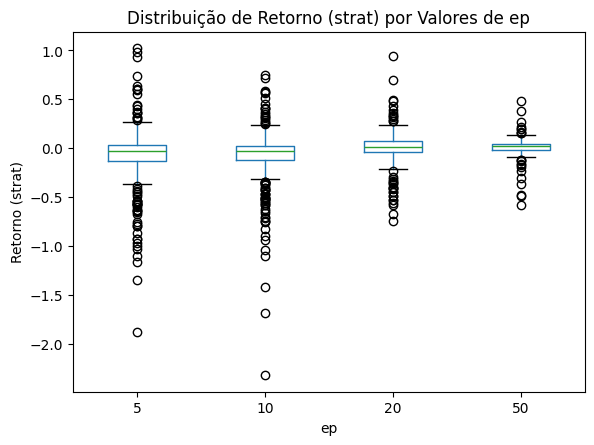

<Figure size 800x600 with 0 Axes>

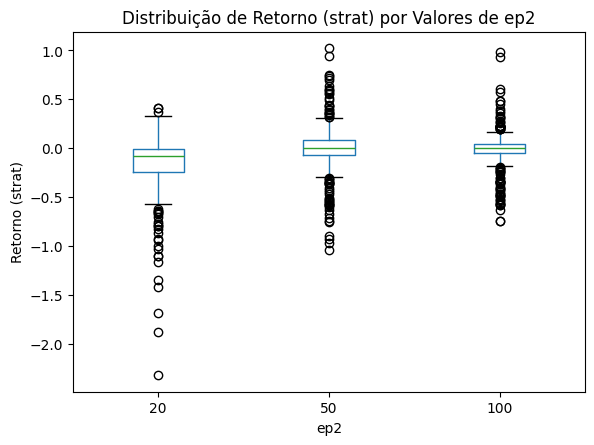

<Figure size 800x600 with 0 Axes>

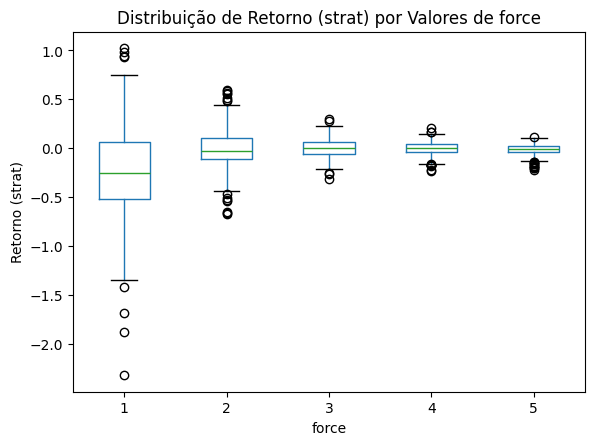

<Figure size 800x600 with 0 Axes>

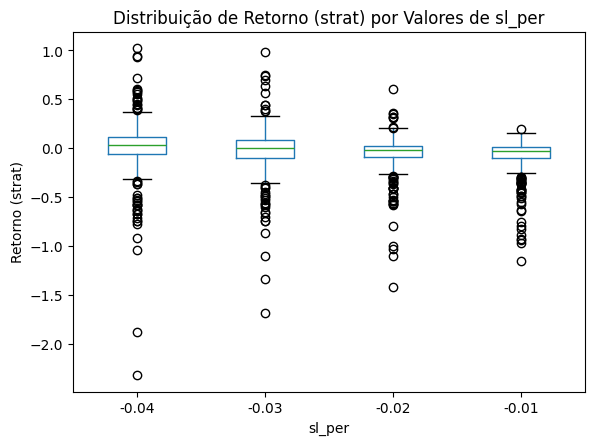

In [22]:
analise_distribuicao(df_res_test)


In [23]:
importancia_parametros = analise_sensibilidade_parametros(df_res_test)
importancia_parametros

MSE: 0.06380799429244187
R²: -0.27875112499745613


,Parâmetro,Importância
0,ep2,0.373025
1,force,0.308722
2,sl_per,0.182495
3,ep,0.135757
4,st,0.000000


In [30]:

df_result = df_res_test.iloc[0].r
df_result.describe()

,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
count,178.000000,178.000000,178.0,178.000000,1.780000e+02,178.000000,178.000000,1.780000e+02,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178,178
mean,208588.713483,334.252809,0.0,0.003272,3.306945e-03,1.359551,0.949438,-4.000000e-02,0.046742,0.003671,0.562675,0.562615,0.533708,0.466292,0.001831,2024-05-28 21:39:57.977528320,2024-05-28 16:06:42.808988928
min,4578.000000,4.000000,0.0,-0.049805,-4.900540e-02,1.000000,0.000000,-4.000000e-02,0.040000,-0.040000,0.400500,0.398200,0.000000,0.000000,-0.024600,2024-01-08 00:35:00,2024-01-07 23:56:00
25%,106994.250000,22.250000,0.0,0.000200,4.968899e-16,1.000000,1.000000,-4.000000e-02,0.040000,0.001000,0.515475,0.518225,0.000000,0.000000,0.000000,2024-03-19 05:41:15,2024-03-19 02:52:15
50%,262536.000000,54.000000,0.0,0.000201,1.001136e-03,1.000000,1.000000,-4.000000e-02,0.040000,0.001000,0.574450,0.573650,1.000000,0.000000,0.000600,2024-07-05 03:59:30,2024-07-05 03:14:00
75%,302317.750000,183.750000,0.0,0.001006,1.805727e-03,2.000000,1.000000,-4.000000e-02,0.040000,0.001000,0.607625,0.607225,1.000000,1.000000,0.001075,2024-08-01 21:09:45,2024-08-01 18:15:45
max,388288.000000,12875.000000,0.0,0.079443,6.908235e-02,4.000000,1.000000,-4.000000e-02,0.160000,0.080243,0.738100,0.739200,1.000000,1.000000,0.037300,2024-09-30 11:53:00,2024-09-30 11:06:00
std,105354.136397,1265.919700,0.0,0.017533,1.690634e-02,0.633298,0.219719,6.958468e-18,0.022286,0.017544,0.066501,0.066041,0.500270,0.500270,0.009078,NaN,NaN


In [31]:
df_result.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
0,False,4578,40,0,0.035724,0.036510,1,False,1,-0.04,0.08,0.036524,buy,0.5513,0.5718,1,0,0.0205,2024-01-08 00:35:00,2024-01-07 23:56:00
1,False,4673,78,0,0.000200,-0.000707,1,False,1,-0.04,0.04,0.001000,sell,0.5659,0.5663,0,1,-0.0004,2024-01-08 02:48:00,2024-01-08 01:31:00
2,False,4752,216,0,0.003092,0.003892,1,False,1,-0.04,0.04,0.001000,sell,0.5663,0.5641,0,1,0.0022,2024-01-08 06:25:00,2024-01-08 02:50:00
3,False,8868,687,0,0.000200,-0.000659,1,False,1,-0.04,0.04,0.001000,sell,0.6071,0.6075,0,1,-0.0004,2024-01-11 10:52:00,2024-01-10 23:26:00
4,False,9910,32,0,0.000863,0.001663,1,False,1,-0.04,0.04,0.001000,buy,0.6009,0.6019,1,0,0.0010,2024-01-11 17:19:00,2024-01-11 16:48:00


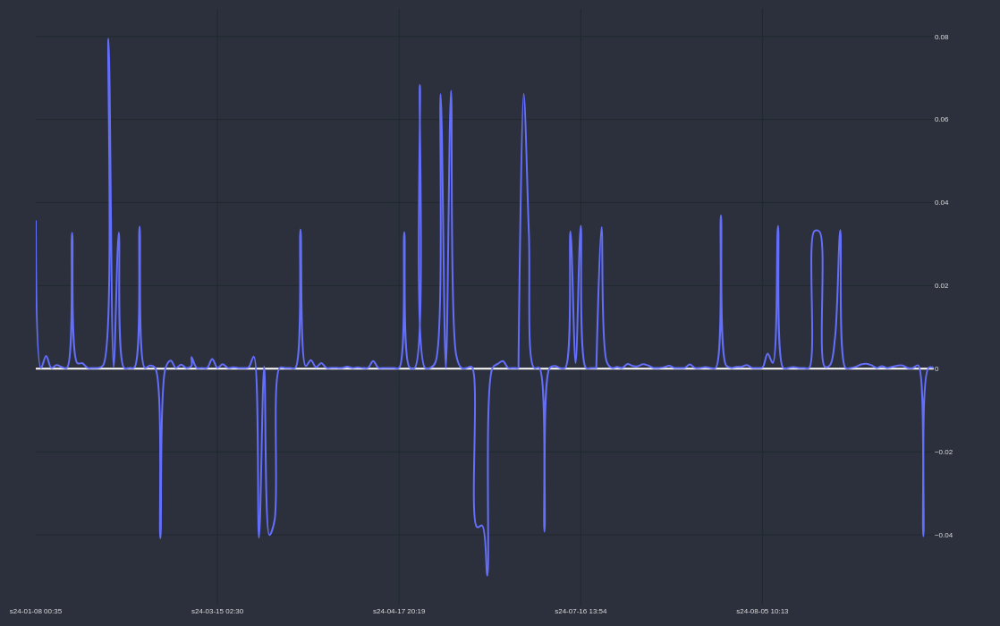

In [32]:
df_result['time'] = df_result['end_time']
cp = CandlePlot(df_result,candles=False)
cp.show_plot(height=700, width=1100, sec_traces=['strategy'])

In [33]:
df_result.sort_values(by='start_time').head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time
0,False,4578,40,0,0.035724,0.036510,1,False,1,-0.04,0.08,0.036524,buy,0.5513,0.5718,1,0,0.0205,2024-01-08 00:35:00,2024-01-07 23:56:00,2024-01-08 00:35:00
1,False,4673,78,0,0.000200,-0.000707,1,False,1,-0.04,0.04,0.001000,sell,0.5659,0.5663,0,1,-0.0004,2024-01-08 02:48:00,2024-01-08 01:31:00,2024-01-08 02:48:00
2,False,4752,216,0,0.003092,0.003892,1,False,1,-0.04,0.04,0.001000,sell,0.5663,0.5641,0,1,0.0022,2024-01-08 06:25:00,2024-01-08 02:50:00,2024-01-08 06:25:00
3,False,8868,687,0,0.000200,-0.000659,1,False,1,-0.04,0.04,0.001000,sell,0.6071,0.6075,0,1,-0.0004,2024-01-11 10:52:00,2024-01-10 23:26:00,2024-01-11 10:52:00
4,False,9910,32,0,0.000863,0.001663,1,False,1,-0.04,0.04,0.001000,buy,0.6009,0.6019,1,0,0.0010,2024-01-11 17:19:00,2024-01-11 16:48:00,2024-01-11 17:19:00


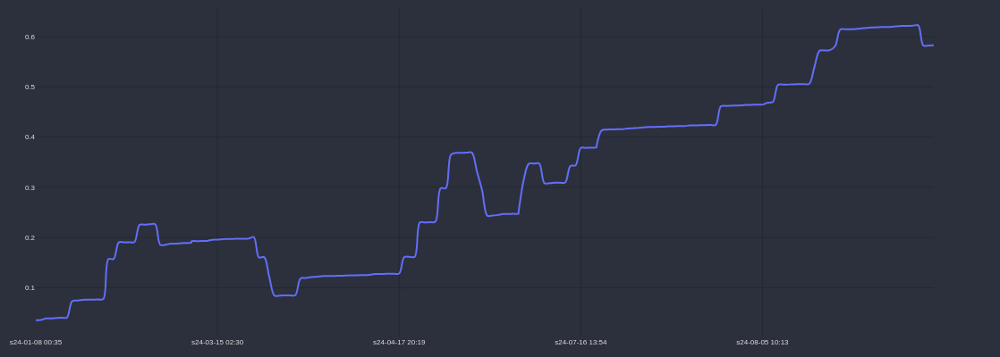

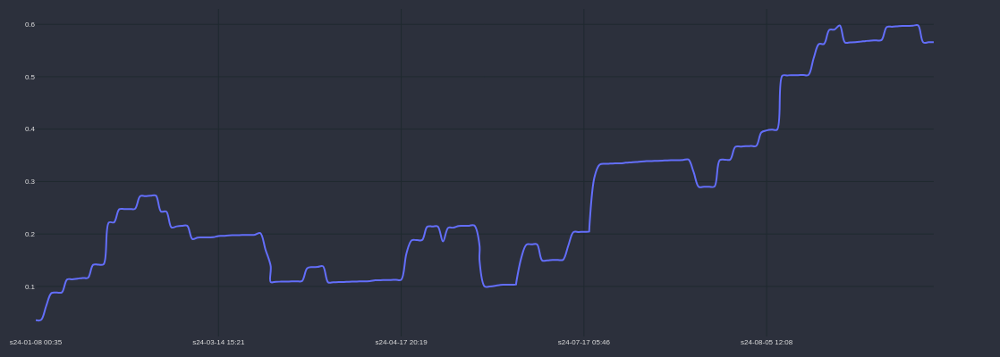

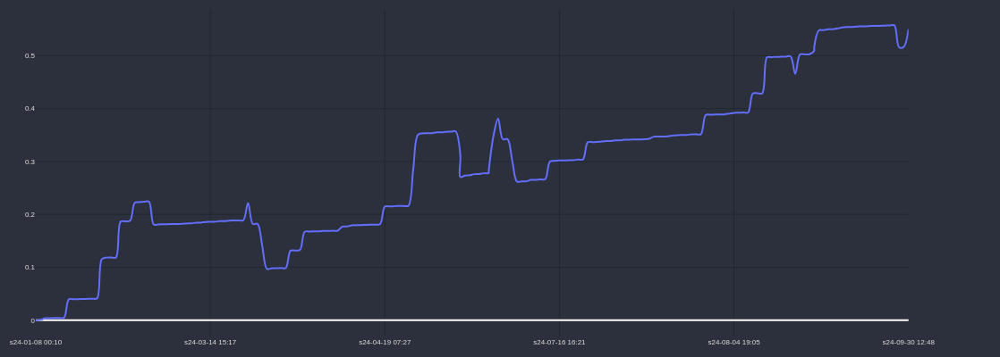

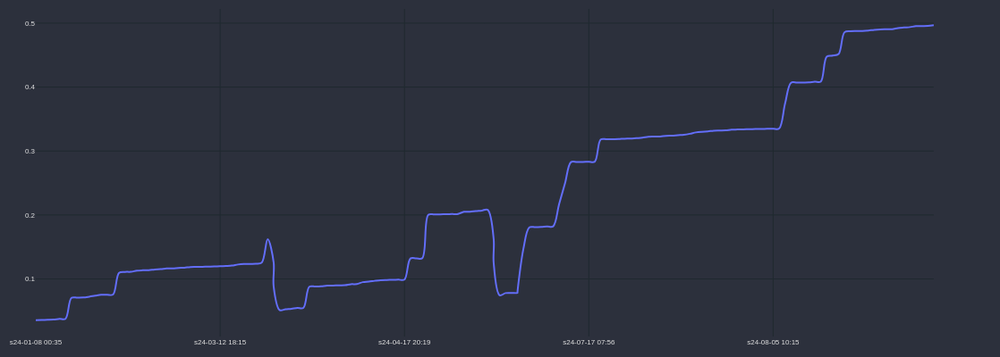

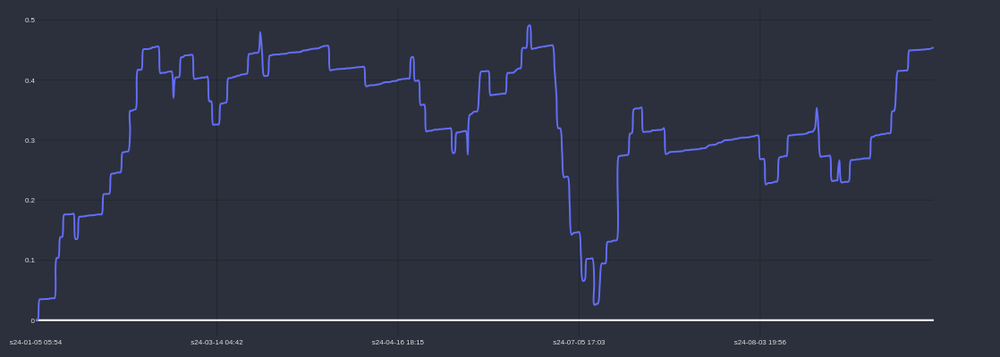

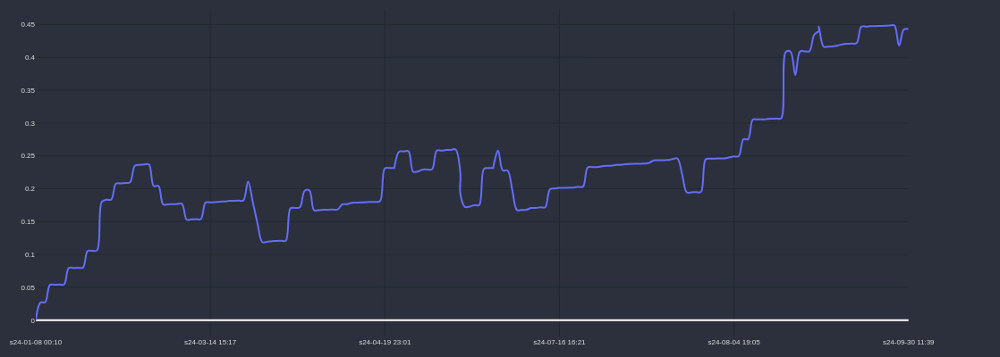

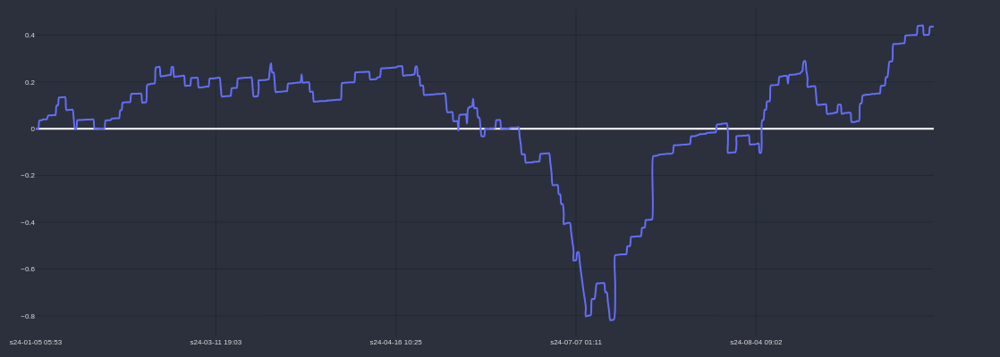

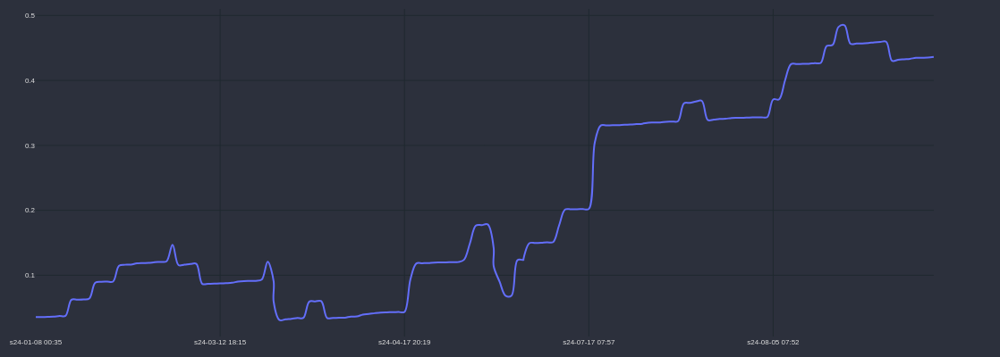

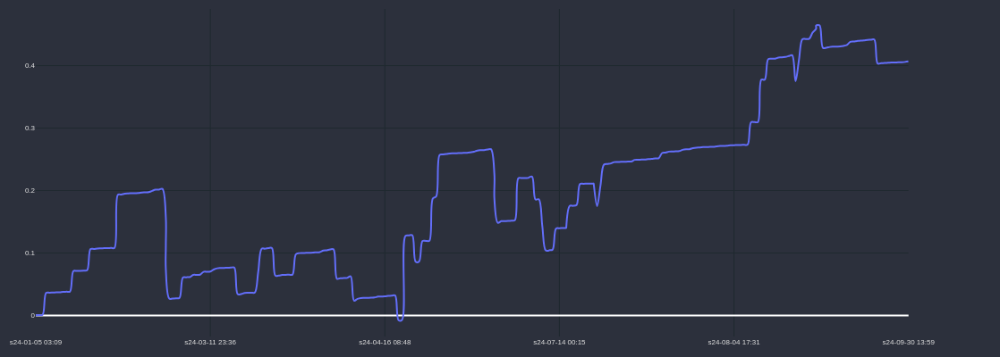

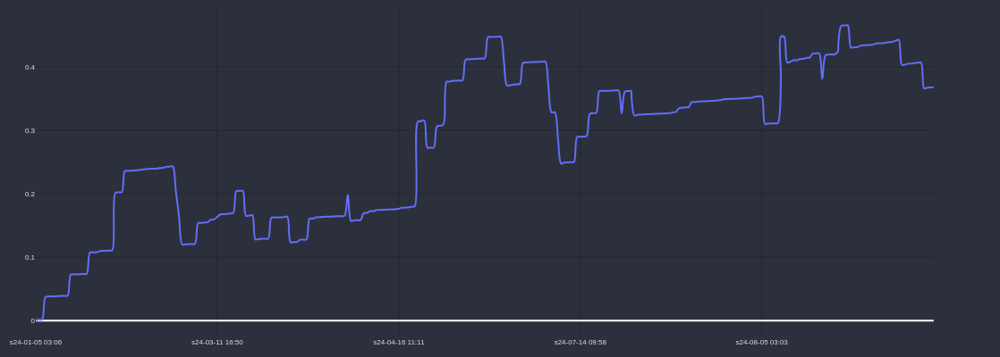

In [34]:
for i in range(10):
    df_result1 = df_res_test.iloc[i].r
    df_result1['time'] = df_result1['end_time']
    df_result1['gain'] = df_result1['strategy'].cumsum()
    cp = CandlePlot(df_result1,candles=False)
    cp.show_plot(line_traces=['gain'])

In [28]:
# ddf = lista[3]['res'].df.copy()
# ddf = lista[0]['res'].copy()
# ddf = df_res_test.iloc[0]['df'].copy()
# ddf.columns

In [34]:
df_result[df_result['strategy'] < 0].head()


,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,gain
2,False,1020,125,0,-0.029750,-0.028950,1,False,0,-0.03,0.03,-0.03,buy,0.5432,0.5277,1,0,-0.0155,2024-01-05 14:42:00,2024-01-05 12:38:00,2024-01-05 14:42:00,-0.029088
12,False,4710,44,0,-0.030901,-0.030101,1,False,0,-0.03,0.03,-0.03,buy,0.4890,0.4745,1,0,-0.0145,2024-01-08 02:51:00,2024-01-08 02:08:00,2024-01-08 02:51:00,-0.002929
38,False,9476,137,0,-0.030967,-0.030167,2,False,0,-0.03,0.03,-0.03,sell,0.5812,0.5990,0,1,-0.0178,2024-01-11 11:50:00,2024-01-11 09:34:00,2024-01-11 11:50:00,0.040076
39,False,9569,105,0,-0.030554,-0.029754,1,False,0,-0.03,0.03,-0.03,sell,0.5927,0.6106,0,1,-0.0179,2024-01-11 12:51:00,2024-01-11 11:07:00,2024-01-11 12:51:00,0.009522
45,False,11336,45,0,-0.035147,-0.034347,1,False,0,-0.03,0.03,-0.03,buy,0.5657,0.5466,1,0,-0.0191,2024-01-12 17:18:00,2024-01-12 16:34:00,2024-01-12 17:18:00,-0.023317


37 25


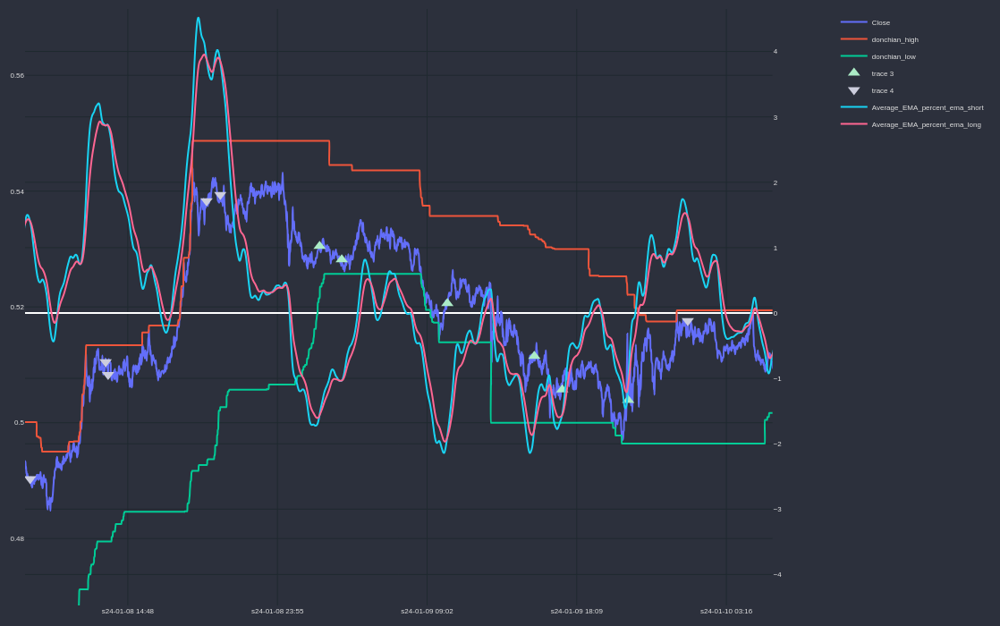

In [35]:
cp = CandlePlot(ddf.iloc[0:20000],candles=False)


trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP == 1]

trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN == 1]

print(len(trades_up),len(trades_down))



marker_trade_up = '#abebc6'
marker_trade_down = '#cccddd'


markers = 'Close'


cp.add_traces(['Close','donchian_high','donchian_low'])


# # SIGNAL UP
cp.fig.add_trace(go.Scatter(
    x = trades_up.sTime,
    y = trades_up[markers],
    mode = 'markers',
    marker_symbol = 'triangle-up',
    marker=dict(color=marker_trade_up, size=12)
))

cp.fig.add_trace(go.Scatter(
    x = trades_down.sTime,
    y = trades_down[markers],
    mode = 'markers',
    marker_symbol = 'triangle-down',
    marker=dict(color=marker_trade_down, size=12)
))


cp.show_plot(height=700, width=1100, sec_traces=['Average_EMA_percent_ema_short','Average_EMA_percent_ema_long'])

In [36]:
# cp = CandlePlot(ddf.iloc[0:50000],candles=False, is_subplots=False)

# cp.add_traces(['Close','High','Low'])
# cp.show_plot(height=700, width=1100, sec_traces=['Average_EMA_percent','Average_EMA_percent_ema_short','Average_EMA_percent_ema_long'])

In [30]:
df_result.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'total_opened', 'first_return', 'trail_stop', 'trail_stop_target',
       'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result',
       'end_time', 'start_time'],
      dtype='object')

In [31]:
df_result[df_result['start_time'] == '2024-09-27 02:33:00']

,running,start_index_m5,count,trigger_type,strategy,total_opened,first_return,trail_stop,trail_stop_target,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
344,False,193394,6,1,-0.000942,6,False,1,0,64968.21,64906.97,1,0,0.0,2024-09-27 02:38:00,2024-09-27 02:33:00


In [32]:
df = res[0]['res'].df
df.columns

Index(['Time', 'Open', 'High', 'Low', 'Close', 'Volume', 'time', 'strategy',
       'returns', 'creturns', 'Log_Returns', 'cLog_Returns', 'EMA_short',
       'EMA_long', 'diff_close_ema_log', 'norm_diff_close_ema_log',
       'diff_abs_close_ema_log', 'norm_diff_abs_close_ema_log',
       'Percent_Change', 'EMA_percent_s', 'EMA_percent_l',
       'norm_EMA_percent_s', 'SIGNAL_UP', 'SIGNAL_DOWN'],
      dtype='object')

In [33]:
index = df[df['time']=='2024-09-27 02:33:00'].index[0]
print(index)

193394


In [34]:
df_test = df.iloc[index:index+20]
df_test['strategy'] = df_test.returns.cumsum()
df_test['strategy2'] = (1 + df_test['returns']).cumprod() - 1
df_test[['Time', 'Close', 'Volume', 'strategy','strategy2','returns']]

,Time,Close,Volume,strategy,strategy2,returns
193394,2024-09-27 02:33:00,64968.21,17.29385,0.000896,0.000896,8.962242e-04
193395,2024-09-27 02:34:00,64970.52,2.89256,0.000932,0.000932,3.555522e-05
193396,2024-09-27 02:35:00,64978.01,4.99901,0.001047,0.001047,1.152764e-04
193397,2024-09-27 02:36:00,64968.25,9.78177,0.000897,0.000897,-1.502159e-04
193398,2024-09-27 02:37:00,64953.33,4.92568,0.000667,0.000667,-2.296770e-04
193399,2024-09-27 02:38:00,64906.97,11.18005,-0.000047,-0.000048,-7.139981e-04
193400,2024-09-27 02:39:00,64919.99,5.39510,0.000154,0.000153,2.005747e-04
193401,2024-09-27 02:40:00,64966.00,22.77322,0.000862,0.000862,7.084675e-04
193402,2024-09-27 02:41:00,64962.00,14.08988,0.000801,0.000800,-6.157256e-05
193403,2024-09-27 02:42:00,64962.01,3.24415,0.000801,0.000800,1.539361e-07


In [33]:
result = df_test['Close'].iloc[-1] - df_test['Close'].iloc[0]
round(result,4)

np.float64(-0.0002)